In [0]:
# Change directory to VSCode workspace root so that relative path loads work correctly. Turn this addition off with the DataScience.changeDirOnImportExport setting
# ms-python.python added
import os
try:
	os.chdir(os.path.join(os.getcwd(), '../..'))
	print(os.getcwd())
except:
	pass


 # Data Quality Exploration
 ## Conclusions
 1. Prices and item quantity sometimes clearly wrong
 2. Only 0.1 % of the items don't have a matching order
 3. 7 % of the orders don't have any matching items, but these orders are all from orders with states 'Place order' and 'Shopping Basket'. So no problems with completed orders
 4. Only around 20 % of the completed orders have matching price between the order price and sum of the prices of the individual items. The percent of the orders with matching prices also shows clear timetrends. The difference almost always small and could be caused by shipping costs and discounts, that we do not see in the data.

In [1]:

import datetime
import os

import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import seaborn as sns
import sklearn
from IPython.core.interactiveshell import InteractiveShell
from IPython.display import HTML

# Setting styles
sns.set(style="whitegrid", color_codes=True)
InteractiveShell.ast_node_interactivity = "all"
%matplotlib inline


In [2]:

raw_path = os.path.join("data", "raw")

# for trans we do not want the header
data_trans = pd.read_csv(
    os.path.join(raw_path, "trans.csv"), skiprows=1, header=None, sep="\n"
)
data_trans = data_trans[0].str.split(",", expand=True)
data_orders = pd.read_csv(
    os.path.join(raw_path, "orders_translated.csv"), sep=";", decimal=","
)
data_items = pd.read_csv(os.path.join(raw_path, "lineitems.csv"), sep=";", decimal=",")



In [3]:

# Sample data
data_trans.head()
data_orders.head()
data_items.head()


,0,1,2,3,4,5,6,7,8,9,10,11,12
0,IFX0049,TUC0302,IFX0014,MOP0083,None,None,None,None,None,None,None,None,None
1,CRU0045,OWC0048,SEA0038,APP1130,None,None,None,None,None,None,None,None,None
2,APP0405,APP1208,None,None,None,None,None,None,None,None,None,None,None
3,BOS0059,APP1457,APP0432,APP2487,APP2552,None,None,None,None,None,None,None,None
4,LGE0038,ELA0004,APP1459,APP1208,LAC0221,None,None,None,None,None,None,None,None


,id_order,created_date,state,total_paid
0,241319,2017-01-02T13:35:40Z,Cancelled,44.99
1,241423,2017-11-06T13:10:02Z,Completed,136.15
2,242832,2017-12-31T17:40:03Z,Completed,15.76
3,243330,2017-02-16T10:59:38Z,Completed,84.98
4,243784,2017-11-24T13:35:19Z,Cancelled,157.86


,id,id_order,product_id,product_quantity,sku,date,unit_price
0,1119109,299539,0,1,OTT0127,2017-01-01T00:07:19Z,18.99
1,1119110,299540,0,1,LGE0037,2017-01-01T00:19:45Z,399.00
2,1119111,299541,0,1,PAR0065,2017-01-01T00:20:57Z,474.05
3,1119112,299542,0,1,WDT0309,2017-01-01T00:51:40Z,68.39
4,1119113,299543,0,1,JBL0098,2017-01-01T01:06:38Z,23.74


Text(0.5, 1.0, 'Number of Rows in Datasets')

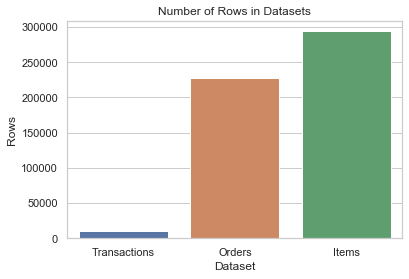

In [4]:

# rows plot
rows_list = [
    ("Transactions", len(data_trans)),
    ("Orders", len(data_orders)),
    ("Items", len(data_items))
]
labels_list = ['Dataset', 'Rows']

row_counts_df = pd.DataFrame.from_records(rows_list, columns=labels_list)
sns.barplot('Dataset', 'Rows', data=row_counts_df)
plt.title("Number of Rows in Datasets")
plt.show()


Text(0.5, 1.0, 'Transactions Missing by Columns')

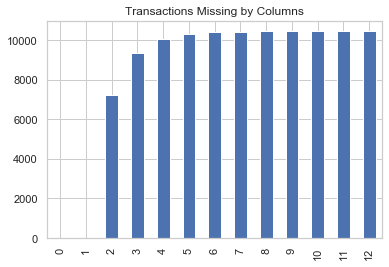

Text(0.5, 1.0, 'Orders Missing by Columns')

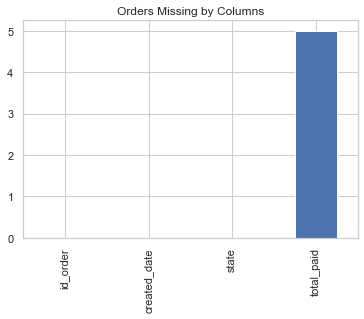

Text(0.5, 1.0, 'Items Missing by Columns')

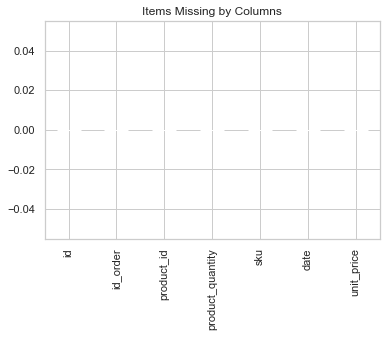

In [5]:

# Number of missing values
data_trans.isnull().sum().plot(kind='bar')
plt.title("Transactions Missing by Columns")
plt.show()
data_orders.isnull().sum().plot(kind='bar')
plt.title("Orders Missing by Columns")
plt.show()
data_items.isnull().sum().plot(kind='bar')
plt.title("Items Missing by Columns")
plt.show()


In [6]:

# checking out more closely the 5 orders with missing values

data_orders[data_orders.total_paid.isnull()]

# All are orders that are pending. This looks okay. We are probably going
# to drop these rows anyway


,id_order,created_date,state,total_paid
127701,427314,2017-11-20T18:54:39Z,Pending,NaN
132013,431655,2017-11-22T12:15:24Z,Pending,NaN
147316,447411,2017-11-27T10:32:37Z,Pending,NaN
148833,448966,2017-11-27T18:54:15Z,Pending,NaN
149434,449596,2017-11-27T21:52:08Z,Pending,NaN


In [7]:

# Adding total price to items that takes into account the number of items
data_items["total_items_price"] = data_items["unit_price"] * data_items["product_quantity"]

# correcting the datetime columns
data_orders.created_date = pd.to_datetime(data_orders.created_date)
data_items.date = pd.to_datetime(data_items.date)

# adding normalized versions for easier handling
data_orders["created_date_norm"] = data_orders["created_date"].dt.normalize()
data_items["date_norm"] = data_items["date"].dt.normalize()

# Lets combine the orders and items with an inner join
data_orders_items = data_orders.join(
    data_items.set_index("id_order"), how="outer", on="id_order", lsuffix="_item"
)

data_orders_items_total_price = (
    data_orders_items[["id_order", "total_items_price"]]
    .groupby(["id_order"], as_index=False)
    .sum()
)

data_orders_items_total_price.columns = ["id_order", "total_price_items"]

data_orders_items = data_orders_items.join(
    data_orders_items_total_price.set_index("id_order"), how="outer", on="id_order"
)



In [8]:
# 2017-01-01 00:07:19 - 2018-03-14 13:58:36

min(data_orders.created_date)
max(data_orders.created_date)
min(data_items.date)
max(data_items.date)

# everything is within the designated period


Timestamp('2017-01-01 00:07:19+0000', tz='UTC')

Timestamp('2018-03-14 13:58:36+0000', tz='UTC')

Timestamp('2017-01-01 00:07:19+0000', tz='UTC')

Timestamp('2018-03-14 13:58:36+0000', tz='UTC')

In [9]:

# Checking duplicates for orders and items. Order ID should be unique
# in orders dataset and ID in items dataset.

sum(data_orders.id_order.value_counts() > 1)
sum(data_items.id.value_counts() > 1)

# no duplicates


0

0

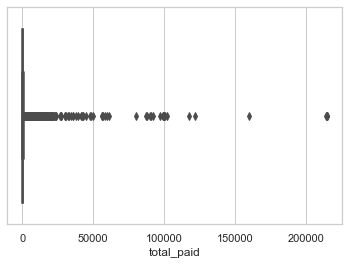

In [10]:

# Checking if the paid sum in orders has weird values

sns.boxplot(data_orders.total_paid.dropna())
plt.show()

# There seem to be lots of values that are zero or close to it.
# There are also lots of values that have extremely high values

# The distrbution looks very much like normal distribution now.
# It seems that it is okay to think about total paid as following
# exponential distribution with a normally distributed error.


(array([0, 1, 2, 3, 4]), <a list of 5 Text xticklabel objects>)

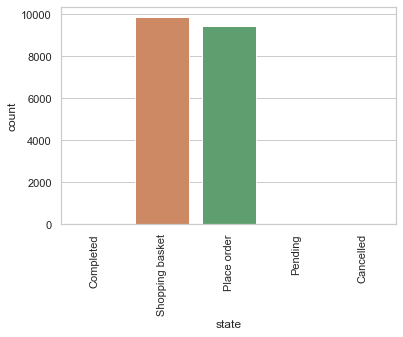

In [11]:

# Lets inspect which kind of orders are those that have 0 paid

sns.countplot(x="state", data=data_orders[data_orders.total_paid == 0])
plt.xticks(rotation=90)
plt.show()

# All these rows are in shopping basket stage or place order state.
# This is good as we will probably drop these categories from the
# analysis


In [12]:

# Lets still check if there are any values that are below 0
data_orders[data_orders.total_paid < 0].shape[0]

# No


0

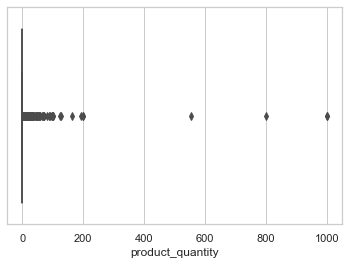

product_quantity min: 1
product_quantity max: 999
unit_price min: -119.0
unit_price max: 159989.83


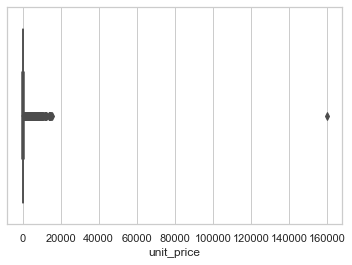

In [13]:

# Checking the distribution of numerical values in items

items_check_list = ["product_quantity", "unit_price"]

for feature in items_check_list:
    sns.boxplot(x=data_items[feature])
    plt.show()
    print(feature + " min: " + str(min(data_items[feature])))
    print(feature + " max: " + str(max(data_items[feature])))

# Same thing as with amount paid in orders: median 0 and extreme outliers.
# There are also some values that are below 0 in unit_price. Total price comes is
# calculated with unit price so it does not give additional value.


In [14]:

data_items[data_items.unit_price < 0]

# Only one row. Probably a mistake, but could also be a refund that is marked in weird way


,id,id_order,product_id,product_quantity,sku,date,unit_price,total_items_price,date_norm
77008,1268645,365886,0,1,APP1459,2017-06-15 12:48:54+00:00,-119.0,-119.0,2017-06-15 00:00:00+00:00


In [15]:

# Lets see how well orders and items combine

data_orders_items.isnull().sum()
data_orders_items.isnull().mean().multiply(100).round(1)
data_orders_items.id_order.nunique()

# 234 (0.1 %) of the items dont' have a matching orderd
# and 22213 (7.0 %) of the orders don't have a matching items


id_order                 0
created_date           234
state                  234
total_paid             240
created_date_norm      234
id                   22213
product_id           22213
product_quantity     22213
sku                  22213
date                 22213
unit_price           22213
total_items_price    22213
date_norm            22213
total_price_items        0
dtype: int64

id_order             0.0
created_date         0.1
state                0.1
total_paid           0.1
created_date_norm    0.1
id                   7.0
product_id           7.0
product_quantity     7.0
sku                  7.0
date                 7.0
unit_price           7.0
total_items_price    7.0
date_norm            7.0
total_price_items    0.0
dtype: float64

227068

In [16]:
# no duplicates

sum(data_orders_items.id.value_counts() > 1)


0

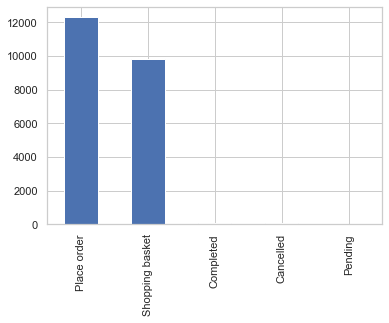

In [17]:

# Lets look more closely at the orders that don't have any items
data_orders_items[data_orders_items.id.isnull()].state.value_counts().plot(kind="bar")

# All are in states Place order and Shopping basket.
# These seems reasonable and should not cause a problem


/home/tuomo/anaconda3/envs/product-associations-discovery/lib/python3.7/site-packages/seaborn/relational.py:792: FutureWarning: Converting timezone-aware DatetimeArray to timezone-naive ndarray with 'datetime64[ns]' dtype. In the future, this will return an ndarray with 'object' dtype where each element is a 'pandas.Timestamp' with the correct 'tz'.
	To accept the future behavior, pass 'dtype=object'.
	To keep the old behavior, pass 'dtype="datetime64[ns]"'.
  x, y = np.asarray(x), np.asarray(y)


Text(0.5, 0, 'Date')

Text(0, 0.5, 'Count of Items')

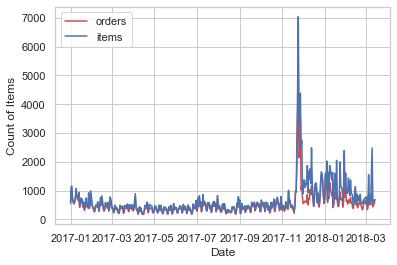

Text(0.5, 0, 'Date')

Text(0, 0.5, 'Price')

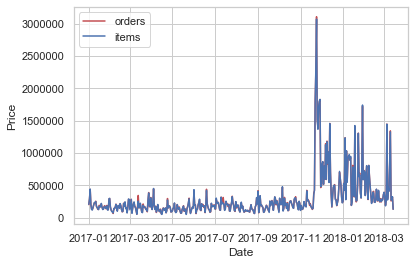

In [18]:

data_orders_ts = (
    data_orders[["created_date_norm", "total_paid"]]
    .groupby(["created_date_norm"], as_index=False)
    .agg(["count", "sum"])
)

data_items_ts = (
    data_items[["date_norm", "total_items_price"]]
    .groupby(["date_norm"], as_index=False)
    .agg(["count", "sum"])
)

fig, ax = plt.subplots()
sns.lineplot(data_orders_ts.index, data_orders_ts.total_paid["count"], color="r", ax=ax)
sns.lineplot(data_items_ts.index, data_items_ts.total_items_price["count"], ax=ax, color="b")
ax.legend(("orders", "items"), loc="upper left")
plt.xlabel("Date")
plt.ylabel("Count of Items")
plt.show()

fig, ax = plt.subplots()
sns.lineplot(data_orders_ts.index, data_orders_ts.total_paid["sum"], color="r", ax=ax)
sns.lineplot(data_items_ts.index, data_items_ts.total_items_price["sum"], ax=ax, color="b")
ax.legend(("orders", "items"), loc="upper left")
plt.xlabel("Date")
plt.ylabel("Price")
plt.show()

# There are less orders than items, so okay on that front

# The price for orders and items lines up quite well, but not completely.
# This could be of shipping costs and discounts?


Text(0.5, 0, 'Date')

Text(0, 0.5, 'Items')

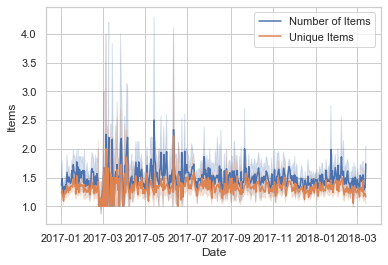

In [19]:

data_orders_items_ts = (
    data_orders_items[data_orders_items.state == "Completed"][
        ["created_date_norm", "id_order", "product_quantity"]
    ]
    .groupby(["created_date_norm", "id_order"])
    .agg(["sum", "count"])
)

fig, ax = plt.subplots()
sns.lineplot(
    data_orders_items_ts.index.get_level_values("created_date_norm"),
    data_orders_items_ts.product_quantity["sum"],
    ax=ax,
    label="Number of Items",
)
sns.lineplot(
    data_orders_items_ts.index.get_level_values("created_date_norm"),
    data_orders_items_ts.product_quantity["count"],
    ax=ax,
    label="Unique Items",
)
ax.legend()
plt.xlabel("Date")
plt.ylabel("Items")
plt.show()

# The average number of items and unique items is below two, and the variation
# is not huge. Probably the number of orders that have a two or more items
# is actually quite small in comparison


In [20]:

data_orders_items_only_two_ts = data_orders_items_ts[
    data_orders_items_ts.product_quantity["count"] >= 2
]

data_orders_items_only_two_ts.shape[0]

# 10453 orders. This matches the rows we have in trans.csv.
# Everything looks to be in order


10453

In [21]:

data_orders_items_unique_order = data_orders_items.drop_duplicates("id_order")
data_orders_items_unique_order["price_matches"] = np.where(
    data_orders_items_unique_order.total_paid
    == data_orders_items_unique_order.total_items_price,
    True,
    False,
)


/home/tuomo/anaconda3/envs/product-associations-discovery/lib/python3.7/site-packages/ipykernel_launcher.py:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  


In [22]:

# looking only at orders from the order dataset. We can use the total_paid
# from the order dataset to achieve this

data_orders_items_unique_order_price_match_ts = (
    data_orders_items_unique_order.query("price_matches == True")
    .dropna(subset=["total_paid"])[["created_date_norm", "id_order", "state"]]
    .groupby(["created_date_norm", "state"])
    .count()
)

data_orders_items_unique_order_all_ts = (
    data_orders_items_unique_order.dropna(subset=["total_paid"])[
        ["created_date_norm", "id_order", "state"]
    ]
    .groupby(["created_date_norm", "state"])
    .count()
)

data_orders_items_unique_order_price_match_ts.columns = ["matching_orders"]
data_orders_items_unique_order_all_ts.columns = ["all_orders"]

data_orders_items_unique_order_price_match_ts = data_orders_items_unique_order_price_match_ts.join(
    data_orders_items_unique_order_all_ts, how="left"
)

data_orders_items_unique_order_price_match_ts[
    "percent_matching"
] = data_orders_items_unique_order_price_match_ts.apply(
    lambda row: round(row.matching_orders * 100 / row.all_orders), axis=1
)

data_orders_items_unique_order_price_match_ts.reset_index(inplace=True)

data_orders_items_unique_order_price_match_ts.head()


,created_date_norm,state,matching_orders,all_orders,percent_matching
0,2017-01-01 00:00:00+00:00,Cancelled,9,17,53.0
1,2017-01-01 00:00:00+00:00,Completed,19,114,17.0
2,2017-01-01 00:00:00+00:00,Pending,5,8,62.0
3,2017-01-01 00:00:00+00:00,Place order,47,91,52.0
4,2017-01-01 00:00:00+00:00,Shopping basket,244,318,77.0


Text(0.5, 20.800000000000054, 'Date')

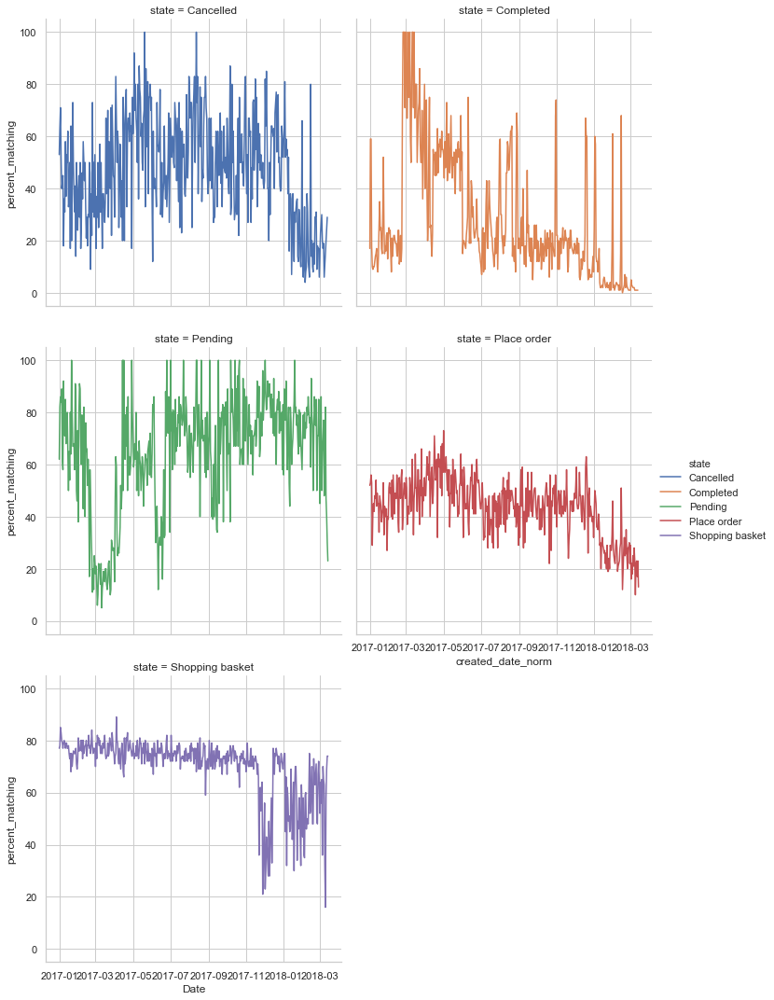

In [23]:


plot = sns.relplot(
    "created_date_norm",
    "percent_matching",
    hue="state",
    col="state",
    col_wrap=2,
    data=data_orders_items_unique_order_price_match_ts,
    kind="line",
)
plt.xlabel("Date")
plt.show()

# Only around 20 % of the orders have matching prices and these
# big temporal changes dropping down to almost 0 by 2018


In [24]:

data_price_diff = data_orders_items_unique_order.dropna(
    subset=["total_paid", "total_items_price"]
).query("price_matches == False")[["state", "total_paid", "total_items_price"]]

data_price_diff["price_diff"] = data_price_diff.apply(
    lambda row: row.total_paid - row.total_items_price, axis=1
)


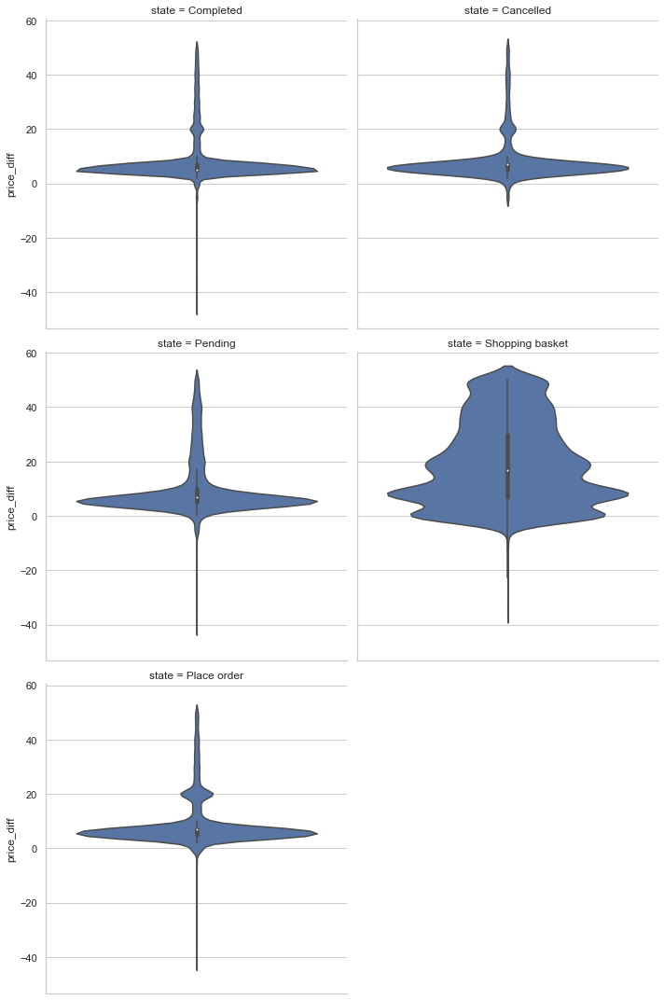

In [25]:

# same but with filtering differences above and below 30

plot = sns.catplot(
    y="price_diff",
    hue="state",
    col="state",
    col_wrap=2,
    kind="violin",
    data=data_price_diff[data_price_diff.price_diff.abs() <= 50],
)
plt.show()

# Order prices are bit higher than the price from individual items
# It think that this is because of the shipping fees and the adjustments
# down are discounts. There are rare extreme differences and these are
# probably true errors

